In [2]:
import sys
import os
sys.path.insert(0, './confined-colloids')

import lammps2d as lmp
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd
from IPython.display import HTML, clear_output
import jsonpickle
import scipy.optimize as spo
import scipy.spatial as spa 


import getpass
import pysftp

import re


%reload_ext autoreload
%autoreload 2
%matplotlib inline

# Description of Processing
## Calculation of the critical frequency

We start by loading the function and calculating the dimers

In [195]:
name = "Z:SimulationsOfDimerSystem/RuptureFrequency/FinerFastMany2/packing0.25_2018_04_28_20_30_40"
hdf_trj = pd.HDFStore(name+".hd5")
trj = hdf_trj.select("trj")
hdf_trj.close()

f = open(name+'.jp')
json_str = f.read()
sim = jsonpickle.decode(json_str)

In [196]:
dim = lmp.dimers(trj, sim, distance=3)
dim = lmp.dimers_findpositions(dim,trj,sim)
#dim = lmp.strict_dimers(dim)
dim.t = pd.to_datetime(dim.t,unit='s')

A Jupyter Widget

Here we can see what we are dealing with.

In [197]:
HTML(lmp.display_animation_direct(sim,trj,start=0,end=30,step=3,speedup=6))

This is how the number of dimmers looks like as a function of frequency. I invent completely a function to fit to this, in the hope of retrieving the cuttoff frequency. 
Inspired by the Addler function, I'll use

$$
N_{rel}\left(f\right) = 
\begin{cases}
1 & f<fc\\
1-\alpha\left(1-\left(\frac{fc}{f}\right)^2\right)^{\frac{1}{\gamma}} & f\geq fc
\end{cases}$$

Here we use the pandas resampling function to ensure there is a value for the number of dimers in every frame.

In [14]:
counts = pd.DataFrame(
    {"members":dim.groupby("frame").count().members.values},index=dim.groupby("frame").min().t)
if not np.any(counts.index==pd.to_datetime(sim.run_parameters.total_time,unit='s')):
    counts.loc[pd.to_datetime(30,unit='s'),'members']=0
counts = counts.resample("100ms").asfreq()[:]
counts.loc[np.isnan(counts.members).values,'members']=0

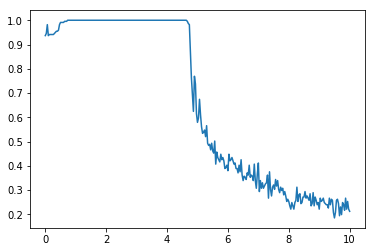

In [15]:
N = counts.members/counts.members.max()
f = pd.to_numeric(counts.index)/1e9/sim.run_parameters.total_time*10

plt.plot(f,N)

In [16]:
def AddlerHigh(f,fc,gm, alpha):
    rel_freq = np.empty(np.shape(f))
    rel_freq[f<=fc] = 1
    rel_freq[f>fc] = 1-alpha * (1-(fc/f[f>fc])**2)**(1/gm)
    return rel_freq

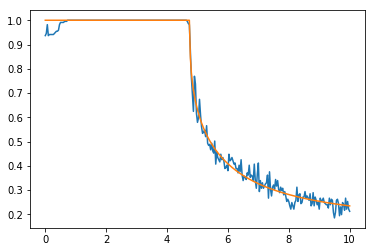

In [18]:
fit = spo.curve_fit(AddlerHigh,f,N,p0=[5,2,1])
fc = fit[0][0]
gm = fit[0][1]
al = fit[0][2]
plt.plot(f,np.vstack((N,AddlerHigh(f,fc,gm,al))).transpose())

## Condense to a single function

In [39]:
def critical_frequency(name):
    print(name)
    hdf_trj = pd.HDFStore(name+".hd5")
    trj = hdf_trj.select("trj")
    hdf_trj.close()
    max_frequency = 10

    f = open(name+'.jp')
    json_str = f.read()
    sim = jsonpickle.decode(json_str)
    
    idx = pd.IndexSlice
    trj = trj.loc[idx[:,:],:]
    
    dim = lmp.dimers(trj, sim, distance=3)
    dim = lmp.dimers_findpositions(dim,trj,sim)
    #dim = lmp.strict_dimers(dim)
    dim.t = pd.to_datetime(dim.t,unit='s')
    
    # Resample to ensure frames without dimers register as zero.
    
    counts = pd.DataFrame(
        {"members":dim.groupby("frame").count().members.values},index=dim.groupby("frame").min().t)
    if not np.any(counts.index==pd.to_datetime(sim.run_parameters.total_time,unit='s')):
        counts.loc[pd.to_datetime(30,unit='s'),'members']=0
    counts = counts.resample("100ms").asfreq()[:]
    counts.loc[np.isnan(counts.members).values,'members']=0

    N = counts.members/counts.members.max()
    f = pd.to_numeric(counts.index)/1e9/sim.run_parameters.total_time*10
    
    try:
        fit = spo.curve_fit(AddlerHigh,f,N,p0=[5,2,1])
        fc = fit[0][0]
        gm = fit[0][1]
        al = fit[0][2]
    except:
        fit = np.NaN
        fc = np.NaN
        
    return fc, N, f, fit

Z:SimulationsOfDimerSystem/RuptureFrequency/FinerFastMany2/packing0.25_2018_04_28_20_30_40


A Jupyter Widget

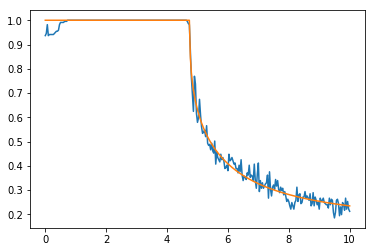

In [20]:
fc, N, f, fit = critical_frequency(name)
fc = fit[0][0]
gm = fit[0][1]
al = fit[0][2]
plt.plot(f,np.vstack((N,AddlerHigh(f,fc,gm,al))).transpose());

## Loop through data files
We use teh previous function to loop through the datafiles in the containing directory. Since the processing step is long, we store all the output. 
* Name of the file
* Packing fraction
* The output of the `critical_frequency` function:
    * Cutoff frequency
    * Proportion of Dimers as function of frequency (Normalized by the initial number of dimers)
    * Frequency array
    * Fitting parameters of the frequency function.

In [169]:
directory = "Z:/SimulationsOfDimerSystem/RuptureFrequency/FinerFastMany2/"

base_names = [os.path.join(root,os.path.splitext(file)[0]) 
              for root, dirs, files in os.walk(directory) 
              for file in files 
              if file.endswith(".hd5")]

In [ ]:
All = list(zip(*[(
    name,
    float(re.findall(r'(?<=packing)\d?[\.]?\d*',name)[0]),
    critical_frequency(name) ) for name in base_names[:]]))

In [171]:
packing = All[1]
frequency = [np.array(f[2]) for f in All[2][:]]
proportion_of_dimers = [f[1].values for f in All[2][:]]
frequency_cutoff = [f[0] for f in All[2][:]]

Save the packing fraction function. This is the main result of this program. We save it as a pandas array with three columns:
* Packing
* Rupture Frequency $F_c$ 
* Filename of the analized test

In [172]:
test_results = pd.DataFrame({"packing":packing,"f_c":frequency_cutoff,"filename":base_names})
test_results.to_csv(directory+"cutoff.dat",sep="\t")

To speed further tests, we also store a multiindex array with the proportion of dimers of all the tests. The `DataFrame` has a single column of (normalized) number of dimers as function of frequency. The first index however, indicates which test file it corresponds to.

In [173]:
ind = pd.MultiIndex.from_tuples(
    [(i,fi) 
         for f,i in zip(frequency,range(len(packing))) 
         for fi in f],
    names=["id","frequency"])
dimer_functions = pd.DataFrame({"N_of_dimers":np.concatenate(proportion_of_dimers)},index=ind)
dimer_functions.to_csv(directory+"N_of_dimers.dat",sep="\t")

In [201]:
dimer_functions.head()

N_of_dimers
id frequency             
0  0.000000      1.000000
   0.033333      0.719424
   0.066667      0.654676
   0.100000      0.651079
   0.133333      0.651079

# Results

Below we show the result of averaging all the tests for different packing fractions.

In [9]:
directory = "Z:/SimulationsOfDimerSystem/RuptureFrequency/FinerFastMany2/"
test_results = pd.read_csv(os.path.join(directory,"cutoff.dat"),sep="\t",index_col=0)

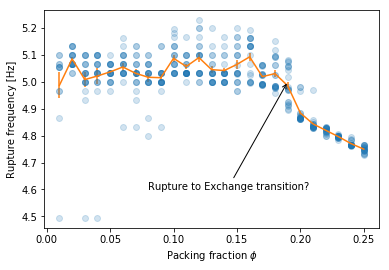

In [26]:
freq = test_results.groupby("packing").mean()
freq_err = test_results.groupby("packing").std()/np.sqrt(test_results.groupby("packing").count())
plt.plot(test_results.packing,test_results.f_c,'o',alpha=0.2)
plt.errorbar(freq.index,freq.f_c,freq_err.f_c)
plt.annotate('Rupture to Exchange transition?',
            xy=(0.19,5),
            xytext=(0.08, 4.6),arrowprops=dict(arrowstyle="->"))
            
plt.xlabel("Packing fraction $\phi$")
plt.ylabel("Rupture frequency [Hz]")

## Comparison to experiments

In [ ]:
exp_data = pd.read_csv("Z:/SimulationsOfDimerSystem/RuptureFrequency/RuptureVsPacking_Experimental.dat",sep="\t")
phi_exp = exp_data["d(%).2"]*0.01
f_exp = exp_data["fr(Hz)h4.3"]

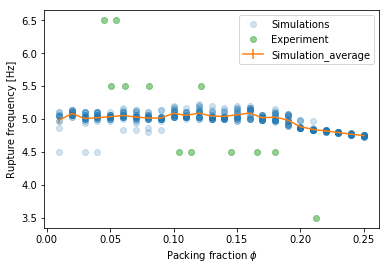

In [31]:
freq = test_results.groupby("packing").mean()
freq_err = test_results.groupby("packing").std()/np.sqrt(test_results.groupby("packing").count())
plt.plot(test_results.packing,test_results.f_c,'o',alpha=0.2)
plt.errorbar(freq.index,freq.f_c,freq_err.f_c)
plt.plot(phi_exp,f_exp,'o',alpha=0.5)
 
plt.legend(["Simulations", "Experiment","Simulation_average"])
            
plt.xlabel("Packing fraction $\phi$")
plt.ylabel("Rupture frequency [Hz]")

It doesn't look like we can conclude that there is a consistent reduction in the cuttoff frequency, until $\phi>0.17$. However, I believe that this point represents a Rupture to Exchange transition, and the reduction in cuttoff frequency has to do with the increased probability of collisions at higher density. Let's see some videos.

# Some Videos

## At very low density

First I don't know what are the points in the lower right corner, which appear as atypical. The lower packing fraction tests are not very reliable because at low density, the initial formation of dimers is not very robust. 

In [13]:
point = test_results[test_results.packing==0.01].min()

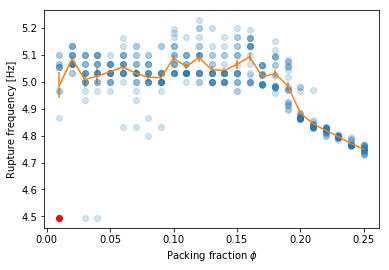

In [14]:
def analyze_point(point):

    freq = test_results.groupby("packing").mean()
    freq_err = test_results.groupby("packing").std()/np.sqrt(test_results.groupby("packing").count())
    plt.plot(test_results.packing,test_results.f_c,'o',alpha=0.2)
    plt.errorbar(freq.index,freq.f_c,freq_err.f_c)
    plt.plot(point.packing,point.f_c,'o',color='r')

    plt.xlabel("Packing fraction $\phi$")
    plt.ylabel("Rupture frequency [Hz]")

    name = point.filename

    hdf_trj = pd.HDFStore(name+".hd5")
    trj = hdf_trj.select("trj")
    hdf_trj.close()

    f = open(name+'.jp')
    json_str = f.read()
    sim = jsonpickle.decode(json_str)

    return lmp.display_animation_direct(sim,trj,start=0,end=30,step=3,speedup=6)

HTML(analyze_point(point))

It appears as if this test has a single dimer. This makes it very unreliable as estimator of the cutoff frequency. 

## Close to Rupture - Exchange transition

Z:/SimulationsOfDimerSystem/RuptureFrequency/FinerFastMany2/packing0.18_2018_04_26_16_19_26


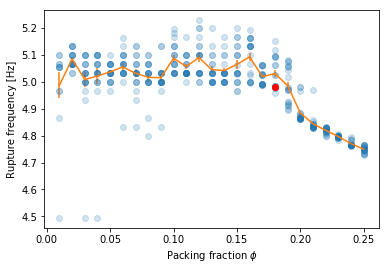

In [256]:
point=test_results.loc[np.random.choice(test_results[test_results.packing==0.18].index)]
print(point.filename)
HTML(analyze_point(point))

Some exchange occurs in this test, but the system mostly falls to a rupture state at the end.

Z:/SimulationsOfDimerSystem/RuptureFrequency/FinerFastMany2/packing0.19_2018_04_28_15_06_58


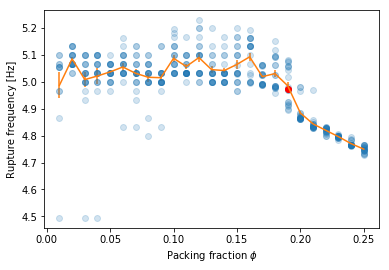

In [257]:
point=test_results.loc[np.random.choice(test_results[test_results.packing==0.19].index)]
print(point.filename)
HTML(analyze_point(point))

Z:/SimulationsOfDimerSystem/RuptureFrequency/FinerFastMany2/packing0.2_2018_04_25_18_43_55


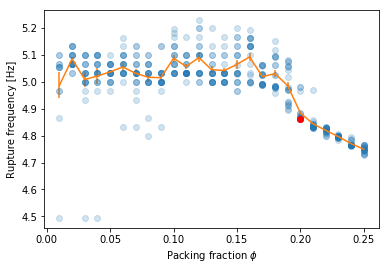

In [258]:
point=test_results.loc[np.random.choice(test_results[test_results.packing==0.20].index)]
print(point.filename)
HTML(analyze_point(point))